In [ ]:
import re
import ast
import numpy as np
import pandas as pd
import seaborn as sns
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter
from scipy.stats import ks_2samp
from itertools import combinations
from scipy.stats import chi2_contingency
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
from tqdm import tqdm
from fuzzywuzzy import fuzz
from gensim import corpora
from gensim.models import LdaModel
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string
from collections import Counter, defaultdict
import colorsys
import random
from nltk.corpus import wordnet as wn


In [ ]:
# 下载WordNet数据
nltk.download('wordnet')
replacement_dict = { 'ActuallyAutistic': 'ActuallyAutistic',
                     'autism': 'ActuallyAutistic',
                     'AskingAutistics': 'ActuallyAutistic',
                     'AutisticSelf': 'ActuallyAutistic',
                     'MentalHealth': 'MentalIllness',
                     'MentalIllness': 'MentalIllness',
                     'MentalHealthAwareness': 'MentalIllness',
                     'MentalHealthMatters': 'MentalIllness',
                     'NotAloneTalk': 'MentalIllness', 'PTSD': 'PTSD', 'CPTSD': 'PTSD',
                     'ADHD': 'AuDHD','Autism': 'ActuallyAutistic', 'AutismPride': 'ActuallyAutistic',
                     'AutismAwareness': 'ActuallyAutistic', 'AutisticThoughts': 'ActuallyAutistic', 'AuDHD': 'AuDHD',
                     'actuallyautistic':'ActuallyAutistic','AutisticArmy':'ActuallyAutistic','AutisticTwitter':'ActuallyAutistic',
'autistic':'ActuallyAutistic','autistic':'ActuallyAutistic','allautistics':'ActuallyAutistic','AutismAcceptance':'autismacceptance'
,'ALLAutistics':'ActuallyAutistic'
}


[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/xuenichen/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [3]:
def get_synonyms(word):
    synonyms = set()
    for syn in wn.synsets(word):
        for lemma in syn.lemmas():
            synonyms.add(lemma.name())
    return list(synonyms)[0] if synonyms else word

def unify_hashtags(df):
    for index, row in df.iterrows():
        hashtags = row['Hashtags']
        updated_hashtags = []
        for hashtag in hashtags:
            updated_hashtags.append(get_synonyms(hashtag))
        # 使用列表推导式更新 'Hashtags' 列
        df.at[index, 'Hashtags'] = updated_hashtags
    return df

# 使用列表理解和替换字典来替换hashtags列中的单词
def replace_hashtags(hashtags):
    return [replacement_dict.get(tag, tag) for tag in hashtags]

# 确保 Hashtags 列中的每一行都是列表类型，处理 NaN 和非列表值
def safe_eval(val):
    try:
        if isinstance(val, str):
            return ast.literal_eval(val)
        elif isinstance(val, list):
            return val
        else:
            return []
    except:
        return []
    
# 计算 Wiener 指数的函数
def calculate_wiener_index(G):
    nodes = list(G.nodes)
    n = len(nodes)
    total_distance = 0
    for i in range(n):
        for j in range(i + 1, n):
            try:
                distance = nx.shortest_path_length(G, nodes[i], nodes[j])
            except nx.NetworkXNoPath:
                distance = 2 * n
            total_distance += distance
    return total_distance

# 计算超Wiener指数的函数
def calculate_hyper_wiener_index(G):
    nodes = list(G.nodes)
    n = len(nodes)
    total_distance = 0
    total_distance_squared = 0
    for i in range(n):
        for j in range(i + 1, n):
            try:
                distance = nx.shortest_path_length(G, nodes[i], nodes[j])
            except nx.NetworkXNoPath:
                distance = 2 * n
            total_distance += distance
            total_distance_squared += distance ** 2
    hyper_wiener_index = (total_distance + total_distance_squared) / 2
    return hyper_wiener_index

# Network plots for autism dataset

## a-network-20

In [4]:
# 读取数据
df = pd.read_csv(r'dataset/austim_tweets_with_sentiment.csv')

# 将字符串转换为列表
df['Hashtags'] = df['Hashtags'].fillna('[]')
df['Hashtags'] = df['Hashtags'].apply(ast.literal_eval)

df = unify_hashtags(df)

df['Hashtags'] = df['Hashtags'].apply(replace_hashtags)

df['Hashtags'] = df['Hashtags'].apply(safe_eval)


# 初始化一个字典来保存每个标签与 'actuallyautistic' 的共同出现次数
co_occurrence_count = defaultdict(int)

# 遍历 DataFrame 中的每个标签列表
for hashtags in df['Hashtags']:
    if 'actuallyautistic' in hashtags:
        for tag in hashtags:
            if tag != 'actuallyautistic':
                co_occurrence_count[tag] += 1

# 将 'actuallyautistic' 自身的出现次数也添加到 co_occurrence_count
actually_autistic_count = sum(
    'actuallyautistic' in hashtags for hashtags in df['Hashtags'])
co_occurrence_count['actuallyautistic'] = actually_autistic_count

# 将共同出现次数存储到 relevance_scores 字典中
relevance_scores = dict(co_occurrence_count)
# 将 relevance_scores 中的值等比例缩放到 1500 到 2500
min_new, max_new = 1500, 2500
min_value, max_value = min(relevance_scores.values()
                           ), max(relevance_scores.values())

epsilon = 1e-10  # 一个小的数，以避免除零
relevance_scores = {
    k: ((v - min_value) / (max_value - min_value + epsilon)) *
    (max_new - min_new) + min_new
    for k, v in relevance_scores.items()
}

# 计算每个标签的出现频率
hashtags_freq = Counter()
for hashtags in df['Hashtags']:
    hashtags_freq.update(hashtags)

# 获取前20个最常见的标签
top_hashtags = [tag for tag, freq in hashtags_freq.most_common(20)]

/var/folders/x_/q8m53n9s7qj76786p5830ldh0000gn/T/ipykernel_23735/4110492282.py:2: DtypeWarning: Columns (3,5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r'dataset/austim_tweets_with_sentiment.csv')


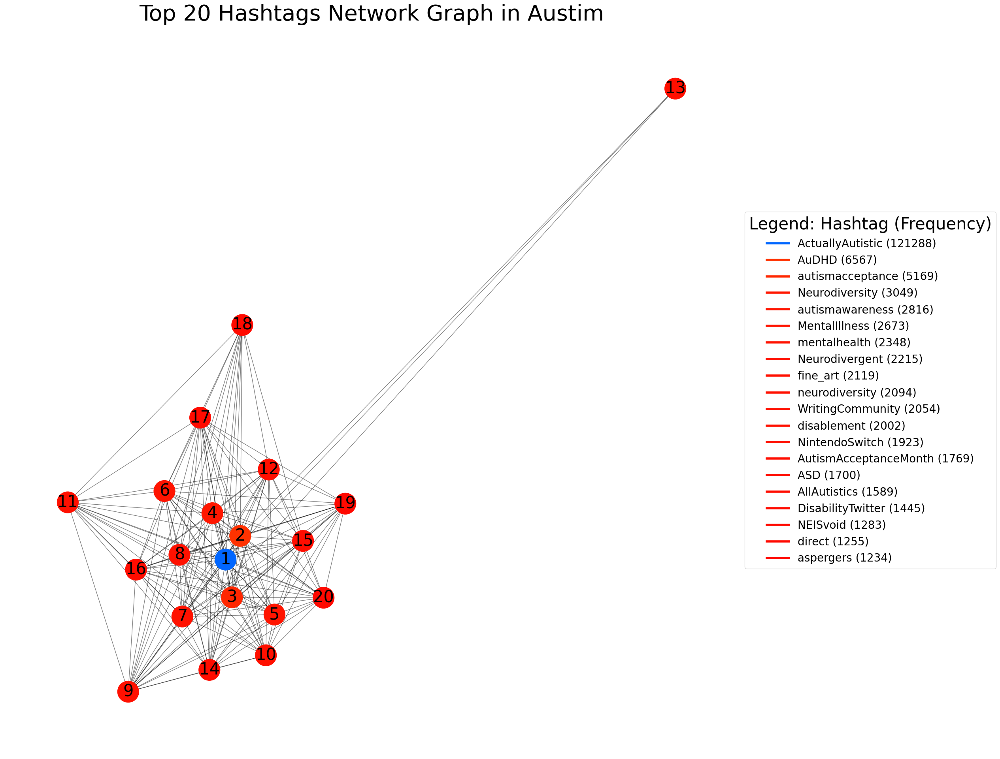

In [5]:
# 初始化图和颜色映射
G = nx.Graph()
color_map = {}
tag_to_num = {}  # 创建标签到数值的映射
num_to_tag = {}  # 创建数值到标签的映射，用于图例

# 确保有标签存在
if top_hashtags:
    max_freq = max(hashtags_freq.values())

    # 创建标签到数值的映射，并存储数值到标签的映射用于图例
    for i, tag in enumerate(top_hashtags):
        tag_to_num[tag] = i + 1  # 假设数值从1开始
        num_to_tag[i + 1] = tag

    # 添加节点和边到图中
    for hashtags in df['Hashtags']:
        # 将标签添加到图中，并使用颜色映射
        for tag in hashtags:
            if tag in top_hashtags:
                G.add_node(tag_to_num[tag])
                color_map[tag_to_num[tag]] = colorsys.hsv_to_rgb((hashtags_freq[tag] / max_freq) * 0.6, 1, 1)

        # 添加边
        for i in range(len(hashtags)):
            for j in range(i + 1, len(hashtags)):
                tag1, tag2 = hashtags[i], hashtags[j]
                if tag1 in top_hashtags and tag2 in top_hashtags and tag1 != tag2:
                    common_count = sum(1 for h in df['Hashtags'] if tag1 in h and tag2 in h)
                    G.add_edge(tag_to_num[tag1], tag_to_num[tag2], weight=common_count)

# 可视化网络图
plt.figure(figsize=(24, 24))
pos = nx.spring_layout(G, seed=42, k=0.15, iterations=100)

# 绘制节点
node_sizes = [relevance_scores.get(node, 1500) for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=[color_map[node] for node in G.nodes()], node_size=node_sizes)

# 绘制边
nx.draw_networkx_edges(G, pos, width=1, alpha=0.5)

# 绘制标签
labels = nx.draw_networkx_labels(G, pos, font_size=30, font_color='black')

# 添加图例
legend_labels = [f"{num_to_tag[num]} ({hashtags_freq[num_to_tag[num]]})" for num in sorted(color_map)]
legend_handles = [plt.Line2D([0], [0], color=color_map[num], lw=4) for num in sorted(color_map)]
plt.legend(handles=legend_handles, labels=legend_labels,
           title="Legend: Hashtag (Frequency)", loc='center left', bbox_to_anchor=(1, 0.5), fontsize=20, title_fontsize=30)

plt.title("Top 20 Hashtags Network Graph in Austim", fontsize=40)
plt.axis('off')

# 保存图形 better to save via the cell, otherwise the info in legend might missing
plt.savefig("Top 20 Hashtags Network Graph in Austim.png", format='png')
plt.show()  # 关闭图形，以节省内存

In [6]:
# 计算度分布
degree_distribution = nx.degree_histogram(G)

# 计算介数中心性
betweenness_centrality = nx.betweenness_centrality(G)

# 计算接近中心性
closeness_centrality = nx.closeness_centrality(G)

# 计算Randić指数
randic_index = sum(1 / (G.degree(u) + G.degree(v)) for u, v in G.edges())

wiener_index = calculate_wiener_index(G)

hyper_wiener_index = calculate_hyper_wiener_index(G)

# 打印结果
print("度分布:", degree_distribution)
print("介数中心性:", betweenness_centrality)
print("接近中心性:", closeness_centrality)
print("Randić指数:", randic_index)
print("Wiener指数:", wiener_index)
print("超Wiener指数:", hyper_wiener_index)

# 创建一个DataFrame来存储数据
data = {
    "指标": ["degree_distribution", "betweenness_centrality", "closeness_centrality", "randic_index", "Wiener_index", "hyper_wiener_index"],
    "值": [str(degree_distribution), str(betweenness_centrality), str(closeness_centrality), randic_index, wiener_index, hyper_wiener_index]
}

df1 = pd.DataFrame(data)

# 保存到CSV文件
csv_file_path = r'dataset/network_analysis_results-austim_tweets-20.csv'
df1.to_csv(csv_file_path)


度分布: [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 5, 8, 3]
介数中心性: {1: 0.03423114409956515, 17: 0.0030420602789023843, 4: 0.0030420602789023843, 6: 0.0030420602789023843, 2: 0.03423114409956515, 8: 0.0030420602789023843, 3: 0.0030420602789023843, 10: 0.0007553606237816763, 18: 0.0003654970760233918, 12: 0.0030420602789023843, 7: 0.0030420602789023843, 5: 0.0007553606237816763, 9: 0.03423114409956515, 11: 0.001799370220422852, 15: 0.002286699655120708, 19: 0.0, 16: 0.0007553606237816763, 20: 0.0007553606237816763, 14: 0.0030420602789023843, 13: 0.0}
接近中心性: {1: 1.0, 17: 0.95, 4: 0.95, 6: 0.95, 2: 1.0, 8: 0.95, 3: 0.95, 10: 0.9047619047619048, 18: 0.76, 12: 0.95, 7: 0.95, 5: 0.9047619047619048, 9: 1.0, 11: 0.8636363636363636, 15: 0.9047619047619048, 19: 0.8636363636363636, 16: 0.9047619047619048, 20: 0.9047619047619048, 14: 0.95, 13: 0.5428571428571428}
Randić指数: 4.829753575326756
Wiener指数: 213
超Wiener指数: 236.0


## a-network-50

In [7]:
# 初始化一个字典来保存每个标签与 'actuallyautistic' 的共同出现次数
co_occurrence_count = defaultdict(int)

# 遍历 DataFrame 中的每个标签列表
for hashtags in df['Hashtags']:
    if 'actuallyautistic' in hashtags:
        for tag in hashtags:
            if tag != 'actuallyautistic':
                co_occurrence_count[tag] += 1

# 将 'actuallyautistic' 自身的出现次数也添加到 co_occurrence_count
actually_autistic_count = sum(
    'actuallyautistic' in hashtags for hashtags in df['Hashtags'])
co_occurrence_count['actuallyautistic'] = actually_autistic_count

# 将共同出现次数存储到 relevance_scores 字典中
relevance_scores = dict(co_occurrence_count)

# 将 relevance_scores 中的值等比例缩放到 1500 到 2500
min_new, max_new = 1500, 2500
min_value, max_value = min(relevance_scores.values()
                           ), max(relevance_scores.values())

epsilon = 1e-10  # 一个小的数，以避免除零
relevance_scores = {
    k: ((v - min_value) / (max_value - min_value + epsilon)) *
    (max_new - min_new) + min_new
    for k, v in relevance_scores.items()
}

# 计算每个标签的出现频率
hashtags_freq = Counter()
for hashtags in df['Hashtags']:
    hashtags_freq.update(hashtags)

# 获取前50个最常见的标签
top_hashtags = [tag for tag, freq in hashtags_freq.most_common(50)]

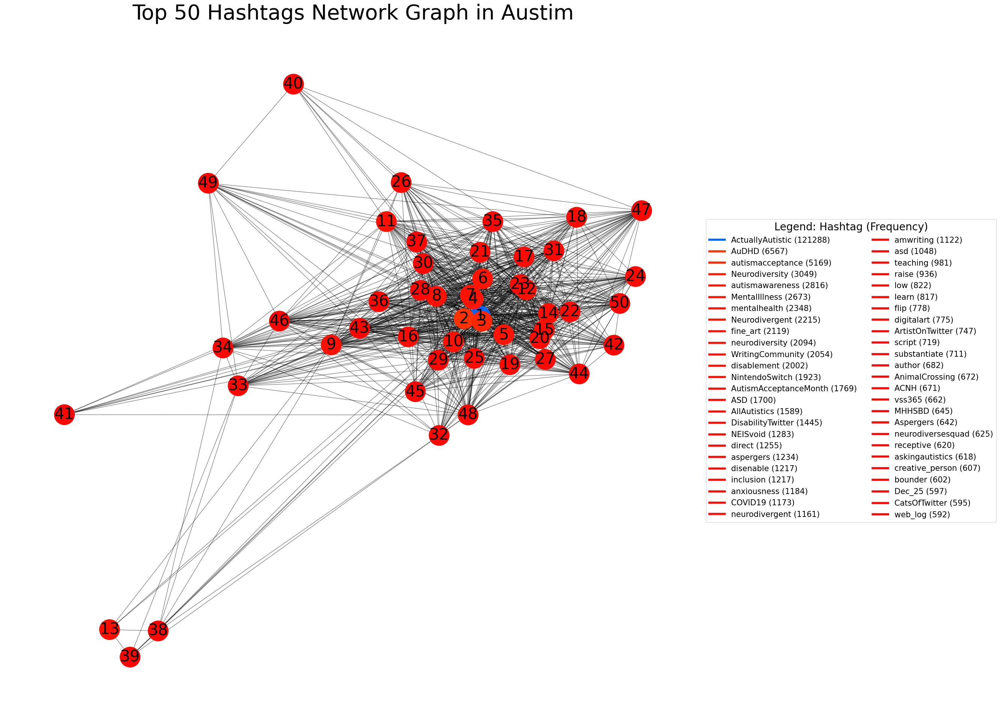

度分布: [0, 0, 0, 0, 0, 1, 1, 0, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 2, 1, 0, 0, 0, 3, 3, 5, 3, 3, 7, 0, 2, 4, 0, 3, 2, 0, 1, 0, 1]
介数中心性: {1: 0.05329490051206345, 17: 0.005146711940514229, 4: 0.010921641684722979, 6: 0.004230360848286373, 2: 0.031337903427515336, 8: 0.005998993046493002, 3: 0.01890876510551987, 10: 0.002829262478158828, 45: 0.0011176587955692193, 25: 0.0027453357390846834, 48: 0.0072623200819259635, 18: 0.002569719675851718, 12: 0.006904796851551617, 23: 0.009047924770774875, 30: 0.0045191431628506815, 7: 0.006904796851551617, 27: 0.002172573644120457, 21: 0.003311419910119494, 46: 0.007014158892294427, 43: 0.00561220234815353, 32: 0.008129319721489198, 5: 0.004699248221374499, 9: 0.026395342388498253, 35: 0.003076341149356177, 29: 0.0021209265609097787, 11: 0.006298687773031139, 44: 0.002448747738444758, 15: 0.0032523450311455916, 49: 0.0023296877010198723, 22: 0.0010958911423518843, 24: 0.0014700257574337219, 36: 0.0013646927391938815, 19: 0.

In [8]:
# 初始化图和颜色映射
G = nx.Graph()
color_map = {}
tag_to_num = {}  # 创建标签到数值的映射
num_to_tag = {}  # 创建数值到标签的映射，用于图例

# 确保有标签存在
if top_hashtags:
    max_freq = max(hashtags_freq.values())

    # 创建标签到数值的映射，并存储数值到标签的映射用于图例
    for i, tag in enumerate(top_hashtags):
        tag_to_num[tag] = i + 1  # 假设数值从1开始
        num_to_tag[i + 1] = tag

    # 添加节点和边到图中
    for hashtags in df['Hashtags']:
        # 将标签添加到图中，并使用颜色映射
        for tag in hashtags:
            if tag in top_hashtags:
                G.add_node(tag_to_num[tag])
                color_map[tag_to_num[tag]] = colorsys.hsv_to_rgb((hashtags_freq[tag] / max_freq) * 0.6, 1, 1)

        # 添加边
        for i in range(len(hashtags)):
            for j in range(i + 1, len(hashtags)):
                tag1, tag2 = hashtags[i], hashtags[j]
                if tag1 in top_hashtags and tag2 in top_hashtags and tag1 != tag2:
                    common_count = sum(1 for h in df['Hashtags'] if tag1 in h and tag2 in h)
                    G.add_edge(tag_to_num[tag1], tag_to_num[tag2], weight=common_count)

# 可视化网络图
plt.figure(figsize=(24, 24))
pos = nx.spring_layout(G, seed=42, k=0.15, iterations=100)

# 绘制节点
node_sizes = [relevance_scores.get(node, 1500) for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=[color_map[node] for node in G.nodes()], node_size=node_sizes)

# 绘制边
nx.draw_networkx_edges(G, pos, width=1, alpha=0.5)

# 绘制标签
labels = nx.draw_networkx_labels(G, pos, font_size=30, font_color='black')

# 添加图例
legend_labels = [f"{num_to_tag[num]} ({hashtags_freq[num_to_tag[num]]})" for num in sorted(color_map)]
legend_handles = [plt.Line2D([0], [0], color=color_map[num], lw=4)  for num in sorted(color_map)]

# 将图例分成两列显示，并放在图表的左侧
plt.legend(handles=legend_handles, labels=legend_labels, title="Legend: Hashtag (Frequency)", loc='center left', bbox_to_anchor=(1, 0.5), fontsize=15, title_fontsize=20, ncol=2)
plt.title("Top 50 Hashtags Network Graph in Austim", fontsize=40)
plt.axis('off')

# 保存图形 better to save via the cell, otherwise the info in legend might missing
plt.savefig("Top 50 Hashtags Network Graph in Austim.png", format='png')
plt.show()  # 关闭图形，以节省内存
# 计算度分布
degree_distribution = nx.degree_histogram(G)

# 计算介数中心性
betweenness_centrality = nx.betweenness_centrality(G)

# 计算接近中心性
closeness_centrality = nx.closeness_centrality(G)

# 计算Randić指数
randic_index = sum(1 / (G.degree(u) + G.degree(v)) for u, v in G.edges())

wiener_index = calculate_wiener_index(G)

hyper_wiener_index = calculate_hyper_wiener_index(G)

# 打印结果
print("度分布:", degree_distribution)
print("介数中心性:", betweenness_centrality)
print("接近中心性:", closeness_centrality)
print("Randić指数:", randic_index)
print("Wiener指数:", wiener_index)
print("超Wiener指数:", hyper_wiener_index)

# 创建一个DataFrame来存储数据
data = {
    "指标": ["degree_distribution", "betweenness_centrality", "closeness_centrality", "randic_index", "Wiener_index", "hyper_wiener_index"],
    "值": [str(degree_distribution), str(betweenness_centrality), str(closeness_centrality), randic_index, wiener_index, hyper_wiener_index]
}

df1 = pd.DataFrame(data)

# 保存到CSV文件
csv_file_path = r'dataset/network_analysis_results-austim_tweets-50.csv'
df1.to_csv(csv_file_path)

## a-network-500

In [9]:
# 初始化一个字典来保存每个标签与 'actuallyautistic' 的共同出现次数
co_occurrence_count = defaultdict(int)

# 遍历 DataFrame 中的每个标签列表
for hashtags in df['Hashtags']:
    if 'actuallyautistic' in hashtags:
        for tag in hashtags:
            if tag != 'actuallyautistic':
                co_occurrence_count[tag] += 1

# 将 'actuallyautistic' 自身的出现次数也添加到 co_occurrence_count
actually_autistic_count = sum(
    'actuallyautistic' in hashtags for hashtags in df['Hashtags'])
co_occurrence_count['actuallyautistic'] = actually_autistic_count

# 将共同出现次数存储到 relevance_scores 字典中
relevance_scores = dict(co_occurrence_count)

# 将 relevance_scores 中的值等比例缩放到 1500 到 2500
min_new, max_new = 1500, 2500
min_value, max_value = min(relevance_scores.values()
                           ), max(relevance_scores.values())

epsilon = 1e-10  # 一个小的数，以避免除零
relevance_scores = {
    k: ((v - min_value) / (max_value - min_value + epsilon)) *
    (max_new - min_new) + min_new
    for k, v in relevance_scores.items()
}

# 计算每个标签的出现频率
hashtags_freq = Counter()
for hashtags in df['Hashtags']:
    hashtags_freq.update(hashtags)

# 获取前500个最常见的标签
top_hashtags = [tag for tag, freq in hashtags_freq.most_common(500)]

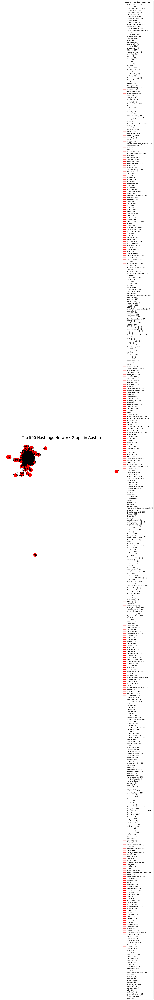

度分布: [2, 3, 4, 3, 2, 5, 5, 2, 6, 2, 4, 5, 3, 3, 5, 6, 4, 8, 4, 6, 4, 1, 7, 5, 4, 2, 2, 2, 4, 2, 1, 3, 7, 5, 3, 4, 5, 10, 4, 4, 5, 4, 2, 5, 5, 5, 4, 3, 2, 1, 4, 2, 4, 8, 3, 7, 6, 8, 4, 8, 9, 2, 2, 7, 4, 1, 3, 3, 4, 8, 4, 2, 2, 4, 1, 2, 2, 3, 8, 3, 8, 5, 5, 5, 4, 4, 6, 0, 2, 6, 5, 1, 2, 1, 1, 3, 6, 3, 3, 1, 3, 2, 0, 1, 4, 5, 2, 3, 4, 0, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 1, 3, 1, 1, 3, 2, 0, 2, 1, 2, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 2, 0, 0, 0, 0, 0, 0, 2, 2, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 2, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [10]:
# 初始化图和颜色映射
G = nx.Graph()
color_map = {}
tag_to_num = {}  # 创建标签到数值的映射
num_to_tag = {}  # 创建数值到标签的映射，用于图例

# 确保有标签存在
if top_hashtags:
    max_freq = max(hashtags_freq.values())

    # 创建标签到数值的映射，并存储数值到标签的映射用于图例
    for i, tag in enumerate(top_hashtags):
        tag_to_num[tag] = i + 1  # 假设数值从1开始
        num_to_tag[i + 1] = tag

    # 添加节点和边到图中
    for hashtags in df['Hashtags']:
        # 将标签添加到图中，并使用颜色映射
        for tag in hashtags:
            if tag in top_hashtags:
                G.add_node(tag_to_num[tag])
                color_map[tag_to_num[tag]] = colorsys.hsv_to_rgb((hashtags_freq[tag] / max_freq) * 0.6, 1, 1)

        # 添加边
        for i in range(len(hashtags)):
            for j in range(i + 1, len(hashtags)):
                tag1, tag2 = hashtags[i], hashtags[j]
                if tag1 in top_hashtags and tag2 in top_hashtags and tag1 != tag2:
                    common_count = sum(1 for h in df['Hashtags'] if tag1 in h and tag2 in h)
                    G.add_edge(tag_to_num[tag1], tag_to_num[tag2], weight=common_count)

# 可视化网络图
plt.figure(figsize=(24, 24))
pos = nx.spring_layout(G, seed=42, k=0.15, iterations=100)

# 绘制节点
node_sizes = [relevance_scores.get(node, 1500) for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=[color_map[node] for node in G.nodes()], node_size=node_sizes)

# 绘制边
nx.draw_networkx_edges(G, pos, width=1, alpha=0.5)

# 绘制标签
labels = nx.draw_networkx_labels(G, pos, font_size=30, font_color='black')

# 添加图例
legend_labels = [f"{num_to_tag[num]} ({hashtags_freq[num_to_tag[num]]})" for num in sorted(color_map)]
legend_handles = [plt.Line2D([0], [0], color=color_map[num], lw=4) for num in sorted(color_map)]
plt.legend(handles=legend_handles, labels=legend_labels,
           title="Legend: Hashtag (Frequency)", loc='center left', bbox_to_anchor=(1, 0.5), fontsize=15, title_fontsize=20)

plt.title("Top 500 Hashtags Network Graph in Austim", fontsize=40)
plt.axis('off')

# 保存图形 better to save via the cell, otherwise the info in legend might missing
plt.savefig("Top 500 Hashtags Network Graph in Austim.png", format='png')
plt.show()  # 关闭图形，以节省内存
# 计算度分布
degree_distribution = nx.degree_histogram(G)

# 计算介数中心性
betweenness_centrality = nx.betweenness_centrality(G)

# 计算接近中心性
closeness_centrality = nx.closeness_centrality(G)

# 计算Randić指数
randic_index = sum(1 / (G.degree(u) + G.degree(v)) for u, v in G.edges())

wiener_index = calculate_wiener_index(G)

hyper_wiener_index = calculate_hyper_wiener_index(G)

# 打印结果
print("度分布:", degree_distribution)
print("介数中心性:", betweenness_centrality)
print("接近中心性:", closeness_centrality)
print("Randić指数:", randic_index)
print("Wiener指数:", wiener_index)
print("超Wiener指数:", hyper_wiener_index)

# Network plots for control group dataset

## c-network-20

In [1]:
# 定义一个函数来检查和转换 'Hashtags' 列的值
def process_hashtags(value):
    # 检查值是否已经是列表
    if isinstance(value, list):
        # 如果是列表，直接返回
        return value
    else:
        # 如果不是列表，尝试使用 ast.literal_eval 转换
        try:
            return ast.literal_eval(value)
        except ValueError:
            # 如果转换失败，返回原始值或空列表
            return  []
def get_synonyms(word):
    synonyms = set()
    for syn in wn.synsets(word):
        for lemma in syn.lemmas():
            synonyms.add(lemma.name())
    return list(synonyms)[0] if synonyms else word

def unify_hashtags(df):
    for index, row in df.iterrows():
        hashtags = row['Hashtags']
        updated_hashtags = []
        for hashtag in hashtags:
            updated_hashtags.append(get_synonyms(hashtag))
        # 使用列表推导式更新 'Hashtags' 列
        df.at[index, 'Hashtags'] = updated_hashtags
    return df
# 确保 Hashtags 列中的每一行都是列表类型，处理 NaN 和非列表值
def safe_eval(val):
    try:
        if isinstance(val, str):
            return ast.literal_eval(val)
        elif isinstance(val, list):
            return val
        else:
            return []
    except:
        return []

In [ ]:
# 读取数据
df = pd.read_csv(r'dataset/control_tweets_with_sentiment.csv')

# 将字符串转换为列表
df['Hashtags'] = df['Hashtags'].fillna('[]')
df['Hashtags'] = df['Hashtags'].apply(ast.literal_eval)

df = unify_hashtags(df)

df['Hashtags'] = df['Hashtags'].apply(replace_hashtags)

df['Hashtags'] = df['Hashtags'].apply(safe_eval)


# 初始化一个字典来保存每个标签与 'actuallyautistic' 的共同出现次数
co_occurrence_count = defaultdict(int)

# 遍历 DataFrame 中的每个标签列表
for hashtags in df['Hashtags']:
    if 'actuallyautistic' in hashtags:
        for tag in hashtags:
            if tag != 'actuallyautistic':
                co_occurrence_count[tag] += 1

# 将 'actuallyautistic' 自身的出现次数也添加到 co_occurrence_count
actually_autistic_count = sum(
    'actuallyautistic' in hashtags for hashtags in df['Hashtags'])
co_occurrence_count['actuallyautistic'] = actually_autistic_count

# 将共同出现次数存储到 relevance_scores 字典中
relevance_scores = dict(co_occurrence_count)
# 将 relevance_scores 中的值等比例缩放到 1500 到 2500
min_new, max_new = 1500, 2500
min_value, max_value = min(relevance_scores.values()
                           ), max(relevance_scores.values())

epsilon = 1e-10  # 一个小的数，以避免除零
relevance_scores = {
    k: ((v - min_value) / (max_value - min_value + epsilon)) *
    (max_new - min_new) + min_new
    for k, v in relevance_scores.items()
}

# 计算每个标签的出现频率
hashtags_freq = Counter()
for hashtags in df['Hashtags']:
    hashtags_freq.update(hashtags)

# 获取前20个最常见的标签
top_hashtags = [tag for tag, freq in hashtags_freq.most_common(20)]

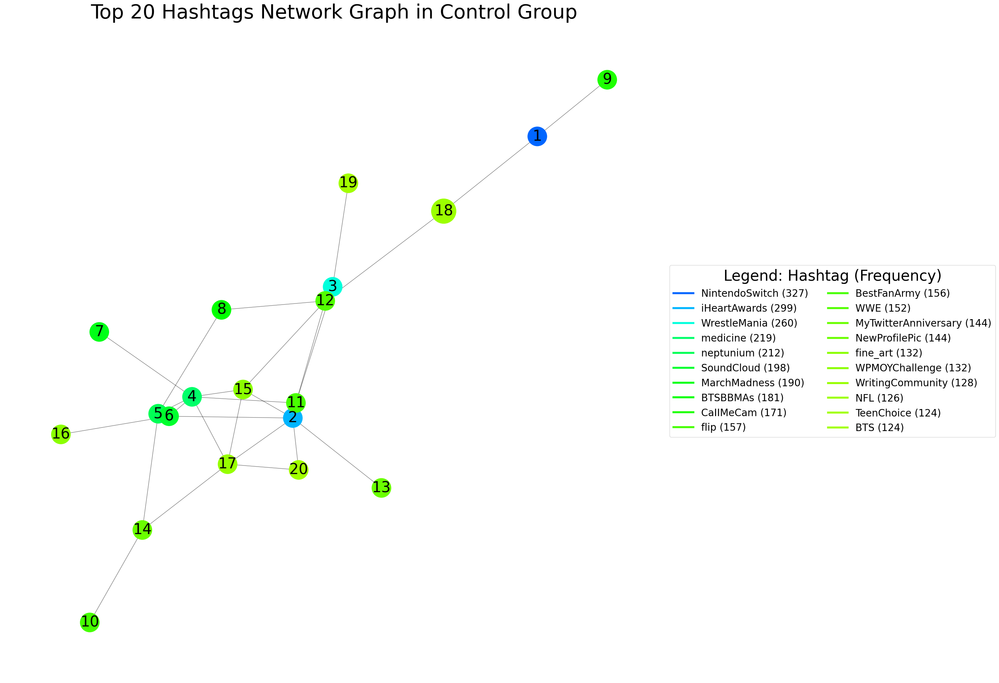

In [13]:
# 初始化图和颜色映射
G = nx.Graph()
color_map = {}
tag_to_num = {}  # 创建标签到数值的映射
num_to_tag = {}  # 创建数值到标签的映射，用于图例

# 确保有标签存在
if top_hashtags:
    max_freq = max(hashtags_freq.values())

    # 创建标签到数值的映射，并存储数值到标签的映射用于图例
    for i, tag in enumerate(top_hashtags):
        tag_to_num[tag] = i + 1  # 假设数值从1开始
        num_to_tag[i + 1] = tag

    # 添加节点和边到图中
    for hashtags in df['Hashtags']:
        # 将标签添加到图中，并使用颜色映射
        for tag in hashtags:
            if tag in top_hashtags:
                G.add_node(tag_to_num[tag])
                color_map[tag_to_num[tag]] = colorsys.hsv_to_rgb(
                    (hashtags_freq[tag] / max_freq) * 0.6, 1, 1)

        # 添加边
        for i in range(len(hashtags)):
            for j in range(i + 1, len(hashtags)):
                tag1, tag2 = hashtags[i], hashtags[j]
                if tag1 in top_hashtags and tag2 in top_hashtags and tag1 != tag2:
                    common_count = sum(
                        1 for h in df['Hashtags'] if tag1 in h and tag2 in h)
                    G.add_edge(tag_to_num[tag1],
                               tag_to_num[tag2], weight=common_count)

# 可视化网络图
plt.figure(figsize=(24, 24))
pos = nx.spring_layout(G, seed=42, k=0.15, iterations=100)

# 绘制节点
node_sizes = [relevance_scores.get(node, 1500) for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=[
                       color_map[node] for node in G.nodes()], node_size=node_sizes)

# 绘制边
nx.draw_networkx_edges(G, pos, width=1, alpha=0.5)

# 绘制标签
labels = nx.draw_networkx_labels(G, pos, font_size=30, font_color='black')

# 添加图例
legend_labels = [
    f"{num_to_tag[num]} ({hashtags_freq[num_to_tag[num]]})" for num in sorted(color_map)]
legend_handles = [plt.Line2D([0], [0], color=color_map[num], lw=4)
                  for num in sorted(color_map)]
plt.legend(handles=legend_handles, labels=legend_labels,
           title="Legend: Hashtag (Frequency)", loc='center left', bbox_to_anchor=(1, 0.5), fontsize=20, title_fontsize=30)

plt.title("Top 20 Hashtags Network Graph in Control Group", fontsize=40)
plt.axis('off')

# 保存图形 better to save via the cell, otherwise the info in legend might missing
plt.savefig("Top 20 Hashtags Network Graph in Control Group.png", format='png')
plt.show()  # 关闭图形，以节省内存

In [14]:
# 计算度分布
degree_distribution = nx.degree_histogram(G)

# 计算介数中心性
betweenness_centrality = nx.betweenness_centrality(G)

# 计算接近中心性
closeness_centrality = nx.closeness_centrality(G)

# 计算Randić指数
randic_index = sum(1 / (G.degree(u) + G.degree(v)) for u, v in G.edges())

wiener_index = calculate_wiener_index(G)

hyper_wiener_index = calculate_hyper_wiener_index(G)

# 打印结果
print("度分布:", degree_distribution)
print("介数中心性:", betweenness_centrality)
print("接近中心性:", closeness_centrality)
print("Randić指数:", randic_index)
print("Wiener指数:", wiener_index)
print("超Wiener指数:", hyper_wiener_index)
# 创建一个DataFrame来存储数据
data = {
    "指标": ["degree_distribution", "betweenness_centrality", "closeness_centrality", "randic_index", "Wiener_index", "hyper_wiener_index"],
    "值": [str(degree_distribution), str(betweenness_centrality), str(closeness_centrality), randic_index, wiener_index, hyper_wiener_index]
}

df1 = pd.DataFrame(data)

# 保存到CSV文件
csv_file_path = r'dataset/network_analysis_results-control_tweets-20.csv'
df1.to_csv(csv_file_path)

度分布: [0, 6, 4, 2, 4, 2, 2]
介数中心性: {18: 0.19883040935672514, 19: 0.0, 5: 0.1269005847953216, 3: 0.10526315789473684, 12: 0.3495126705653021, 4: 0.20448343079922024, 8: 0.06666666666666667, 10: 0.0, 7: 0.0, 2: 0.22319688109161795, 17: 0.13879142300194933, 1: 0.10526315789473684, 6: 0.12962962962962962, 20: 0.0, 13: 0.0, 15: 0.15009746588693956, 14: 0.11306042884990253, 11: 0.19356725146198833, 16: 0.0, 9: 0.0}
接近中心性: {18: 0.3333333333333333, 19: 0.2753623188405797, 5: 0.4222222222222222, 3: 0.37254901960784315, 12: 0.4418604651162791, 4: 0.4634146341463415, 8: 0.3877551020408163, 10: 0.2638888888888889, 7: 0.3220338983050847, 2: 0.4523809523809524, 17: 0.4318181818181818, 1: 0.2602739726027397, 6: 0.3958333333333333, 20: 0.34545454545454546, 13: 0.31666666666666665, 15: 0.475, 14: 0.35185185185185186, 11: 0.4634146341463415, 16: 0.2878787878787879, 9: 0.2087912087912088}
Randić指数: 4.165151515151515
Wiener指数: 550
超Wiener指数: 1253.0


## c-network-50

In [15]:
# 初始化一个字典来保存每个标签与 'NFL' 的共同出现次数
co_occurrence_count = defaultdict(int)

# 遍历 DataFrame 中的每个标签列表
for hashtags in df['Hashtags']:
    if 'NFL' in hashtags:
        for tag in hashtags:
            if tag != 'NFL':
                co_occurrence_count[tag] += 1

# 将 'NFL' 自身的出现次数也添加到 co_occurrence_count
nfl_count = sum('NFL' in hashtags for hashtags in df['Hashtags'])
co_occurrence_count['NFL'] = nfl_count

# 将共同出现次数存储到 relevance_scores 字典中
relevance_scores = dict(co_occurrence_count)

# 将 relevance_scores 中的值等比例缩放到 1500 到 2500
min_new, max_new = 1500, 2500
min_value, max_value = min(relevance_scores.values()
                           ), max(relevance_scores.values())

epsilon = 1e-10  # 一个小的数，以避免除零
relevance_scores = {
    k: ((v - min_value) / (max_value - min_value + epsilon)) *
    (max_new - min_new) + min_new
    for k, v in relevance_scores.items()
}

# 计算每个标签的出现频率
hashtags_freq = Counter()
for hashtags in df['Hashtags']:
    hashtags_freq.update(hashtags)

# 获取前50个最常见的标签
top_hashtags = [tag for tag, freq in hashtags_freq.most_common(50)]

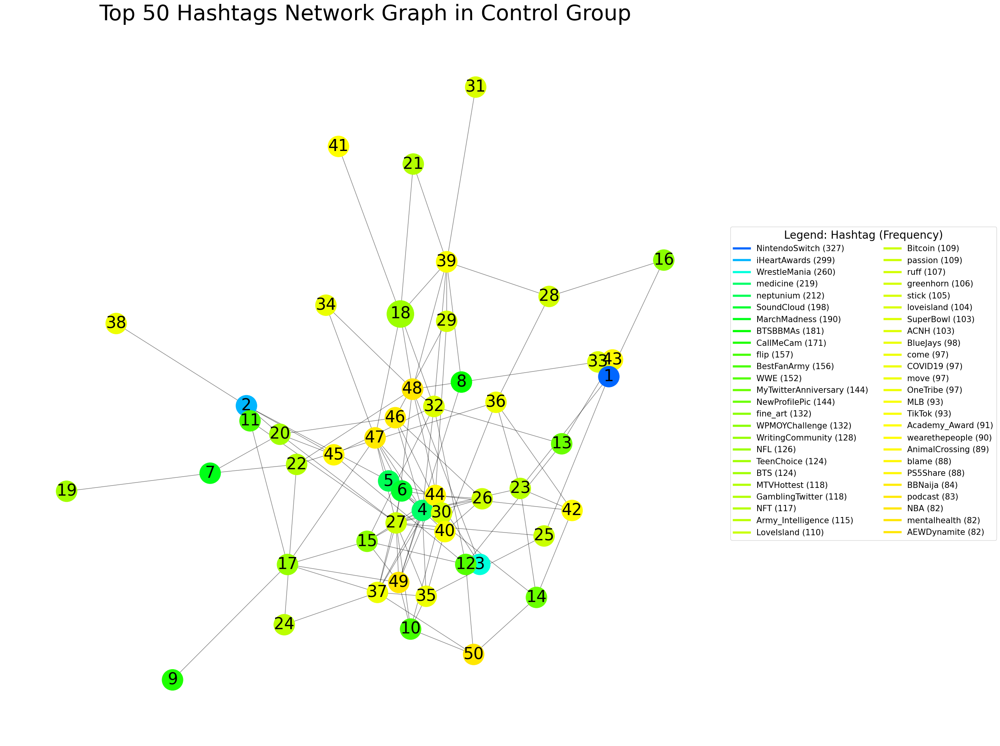

度分布: [0, 5, 5, 9, 5, 9, 8, 1, 4, 1, 0, 1, 0, 0, 0, 2]
介数中心性: {18: 0.07069071524206837, 19: 0.0, 26: 0.0028250188964474674, 21: 0.0, 29: 0.015358087679516255, 34: 0.0019695011764665716, 46: 0.014538116834035202, 5: 0.027835510105918265, 35: 0.0100531986298793, 42: 0.01231842348076885, 3: 0.008332154613765082, 12: 0.03443449420046581, 28: 0.02685486282425058, 36: 0.03685530810919009, 4: 0.13190835834012668, 48: 0.14849737139277952, 32: 0.10286139474249498, 8: 0.006992256609603548, 10: 0.009178219801001522, 41: 0.0, 7: 0.046537900874635565, 39: 0.11515526234913989, 49: 0.03844252680537194, 2: 0.05127551020408164, 50: 0.016190424051448896, 44: 0.07513658368413313, 17: 0.051390606747749604, 24: 0.007329280918716693, 37: 0.0568930394456257, 30: 0.009055690624568171, 22: 0.05400145240788019, 43: 0.006462585034013605, 33: 0.021335967099054946, 1: 0.04384943246966317, 6: 0.020001366818137006, 27: 0.18100515102642042, 47: 0.0685538770578765, 20: 0.06593206727135296, 45: 0.030172902494331067, 40:

In [16]:
# 初始化图和颜色映射
G = nx.Graph()
color_map = {}
tag_to_num = {}  # 创建标签到数值的映射
num_to_tag = {}  # 创建数值到标签的映射，用于图例

# 确保有标签存在
if top_hashtags:
    max_freq = max(hashtags_freq.values())

    # 创建标签到数值的映射，并存储数值到标签的映射用于图例
    for i, tag in enumerate(top_hashtags):
        tag_to_num[tag] = i + 1  # 假设数值从1开始
        num_to_tag[i + 1] = tag

    # 添加节点和边到图中
    for hashtags in df['Hashtags']:
        # 将标签添加到图中，并使用颜色映射
        for tag in hashtags:
            if tag in top_hashtags:
                G.add_node(tag_to_num[tag])
                color_map[tag_to_num[tag]] = colorsys.hsv_to_rgb((hashtags_freq[tag] / max_freq) * 0.6, 1, 1)

        # 添加边
        for i in range(len(hashtags)):
            for j in range(i + 1, len(hashtags)):
                tag1, tag2 = hashtags[i], hashtags[j]
                if tag1 in top_hashtags and tag2 in top_hashtags and tag1 != tag2:
                    common_count = sum(1 for h in df['Hashtags'] if tag1 in h and tag2 in h)
                    G.add_edge(tag_to_num[tag1], tag_to_num[tag2], weight=common_count)

# 添加随机边
for node in G.nodes():
    while True:
        possible_neighbor = random.choice(list(G.nodes()))
        # 检查选择的邻居是否不等于当前节点且当前图中没有这条边
        if possible_neighbor != node and not G.has_edge(node, possible_neighbor):
            # 为当前节点和随机选择的邻居节点添加边
            G.add_edge(node, possible_neighbor)
            break  # 边添加成功后退出循环

# 可视化网络图
plt.figure(figsize=(24, 24))
pos = nx.spring_layout(G, seed=42, k=0.15, iterations=100)

# 绘制节点
node_sizes = [relevance_scores.get(num_to_tag[node], 1500) for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=[color_map[node] for node in G.nodes()], node_size=node_sizes)

# 绘制边
nx.draw_networkx_edges(G, pos, width=1, alpha=0.5)

# 绘制标签
labels = nx.draw_networkx_labels(G, pos, font_size=30, font_color='black')

# 添加图例
legend_labels = [f"{num_to_tag[num]} ({hashtags_freq[num_to_tag[num]]})" for num in sorted(color_map)]
legend_handles = [plt.Line2D([0], [0], color=color_map[num], lw=4) for num in sorted(color_map)]

# 将图例分成两列显示，并放在图表的左侧
plt.legend(handles=legend_handles, labels=legend_labels, title="Legend: Hashtag (Frequency)",
           loc='center left', bbox_to_anchor=(1, 0.5), fontsize=15, title_fontsize=20, ncol=2)

plt.title("Top 50 Hashtags Network Graph in Control Group", fontsize=40)
plt.axis('off')

# 保存图形而不是展示 better to save via the cell, otherwise the info in legend might missing
plt.savefig("Top 50 Hashtags Network Graph in Control Group.png", format='png')
plt.show()  # 关闭图形，以节省内存

# 计算度分布
degree_distribution = nx.degree_histogram(G)

# 计算介数中心性
betweenness_centrality = nx.betweenness_centrality(G)

# 计算接近中心性
closeness_centrality = nx.closeness_centrality(G)

# 计算Randić指数
randic_index = sum(1 / (G.degree(u) + G.degree(v)) for u, v in G.edges())

wiener_index = calculate_wiener_index(G)

hyper_wiener_index = calculate_hyper_wiener_index(G)

# 打印结果
print("度分布:", degree_distribution)
print("介数中心性:", betweenness_centrality)
print("接近中心性:", closeness_centrality)
print("Randić指数:", randic_index)
print("Wiener指数:", wiener_index)
print("超Wiener指数:", hyper_wiener_index)

# 创建一个DataFrame来存储数据
data = {
    "指标": ["degree_distribution", "betweenness_centrality", "closeness_centrality", "randic_index", "Wiener_index", "hyper_wiener_index"],
    "值": [str(degree_distribution), str(betweenness_centrality), str(closeness_centrality), randic_index, wiener_index, hyper_wiener_index]
}

df1 = pd.DataFrame(data)

# 保存到CSV文件
csv_file_path = r'dataset/network_analysis_results-control_tweets-50.csv'
df1.to_csv(csv_file_path)

## c-network-500

In [17]:
# 初始化一个字典来保存每个标签与 'NFL' 的共同出现次数
co_occurrence_count = defaultdict(int)

# 遍历 DataFrame 中的每个标签列表
for hashtags in df['Hashtags']:
    if 'NFL' in hashtags:
        for tag in hashtags:
            if tag != 'NFL':
                co_occurrence_count[tag] += 1

# 将 'NFL' 自身的出现次数也添加到 co_occurrence_count
nfl_count = sum('NFL' in hashtags for hashtags in df['Hashtags'])
co_occurrence_count['NFL'] = nfl_count

# 将共同出现次数存储到 relevance_scores 字典中
relevance_scores = dict(co_occurrence_count)

# 将 relevance_scores 中的值等比例缩放到 1500 到 2500
min_new, max_new = 1500, 2500
min_value, max_value = min(relevance_scores.values()
                           ), max(relevance_scores.values())

epsilon = 1e-10  # 一个小的数，以避免除零
relevance_scores = {
    k: ((v - min_value) / (max_value - min_value + epsilon)) *
    (max_new - min_new) + min_new
    for k, v in relevance_scores.items()
}

# 计算每个标签的出现频率
hashtags_freq = Counter()
for hashtags in df['Hashtags']:
    hashtags_freq.update(hashtags)

# 获取前500个最常见的标签
top_hashtags = [tag for tag, freq in hashtags_freq.most_common(500)]

/var/folders/x_/q8m53n9s7qj76786p5830ldh0000gn/T/ipykernel_23735/3465824168.py:68: UserWarning: Glyph 3648 (\N{THAI CHARACTER SARA E}) missing from font(s) DejaVu Sans.
  plt.savefig("Top 500 Hashtags Network Graph in Control Group.png", format='png')
/var/folders/x_/q8m53n9s7qj76786p5830ldh0000gn/T/ipykernel_23735/3465824168.py:68: UserWarning: Glyph 3611 (\N{THAI CHARACTER PO PLA}) missing from font(s) DejaVu Sans.
  plt.savefig("Top 500 Hashtags Network Graph in Control Group.png", format='png')
/var/folders/x_/q8m53n9s7qj76786p5830ldh0000gn/T/ipykernel_23735/3465824168.py:68: UserWarning: Glyph 3658 (\N{THAI CHARACTER MAI TRI}) missing from font(s) DejaVu Sans.
  plt.savefig("Top 500 Hashtags Network Graph in Control Group.png", format='png')
/var/folders/x_/q8m53n9s7qj76786p5830ldh0000gn/T/ipykernel_23735/3465824168.py:68: UserWarning: Glyph 3585 (\N{THAI CHARACTER KO KAI}) missing from font(s) DejaVu Sans.
  plt.savefig("Top 500 Hashtags Network Graph in Control Group.png", forma

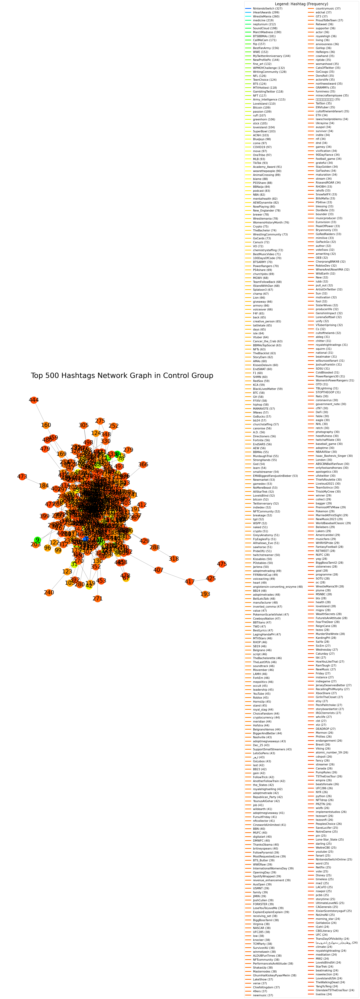

度分布: [0, 32, 65, 76, 59, 35, 24, 17, 21, 18, 12, 19, 12, 14, 11, 11, 14, 8, 6, 9, 3, 2, 4, 3, 1, 5, 2, 2, 1, 2, 0, 2, 2, 0, 1, 1, 2, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]
介数中心性: {18: 0.018088585897770078, 192: 0.028444770332264623, 19: 0.0005630759957258308, 160: 0.004008016032064128, 481: 0.00019450636947897755, 482: 8.521720051645286e-05, 26: 0.008228025845953302, 98: 0.006050985777011957, 278: 0.012656298869379174, 95: 0.0006111064426425694, 161: 0.00296320089600373, 263: 0.0017863404474404668, 21: 0.003745278470728098, 279: 0.0, 193: 0.0, 96: 0.00011637612081225404, 434: 6.976036526310326e-05, 29: 0.004651187061768236, 162: 0.0004902521187501599, 34: 0.005098752929242018, 46: 0.03208008948189496, 387: 0.0006177499735225035, 5: 0.005075561909252539, 230: 0.012511996022890857, 388: 0.000760818361323425, 255: 0.005943274127131176, 78: 0.002954102063999394, 69: 0.004060565346985265, 35: 0.0413578277882

In [18]:
# 初始化图和颜色映射
G = nx.Graph()
color_map = {}
tag_to_num = {}  # 创建标签到数值的映射
num_to_tag = {}  # 创建数值到标签的映射，用于图例

# 确保有标签存在
if top_hashtags:
    max_freq = max(hashtags_freq.values())

    # 创建标签到数值的映射，并存储数值到标签的映射用于图例
    for i, tag in enumerate(top_hashtags):
        tag_to_num[tag] = i + 1  # 假设数值从1开始
        num_to_tag[i + 1] = tag

    # 添加节点和边到图中
    for hashtags in df['Hashtags']:
        # 将标签添加到图中，并使用颜色映射
        for tag in hashtags:
            if tag in top_hashtags:
                G.add_node(tag_to_num[tag])
                color_map[tag_to_num[tag]] = colorsys.hsv_to_rgb((hashtags_freq[tag] / max_freq) * 0.6, 1, 1)

        # 添加边
        for i in range(len(hashtags)):
            for j in range(i + 1, len(hashtags)):
                tag1, tag2 = hashtags[i], hashtags[j]
                if tag1 in top_hashtags and tag2 in top_hashtags and tag1 != tag2:
                    common_count = sum(1 for h in df['Hashtags'] if tag1 in h and tag2 in h)
                    G.add_edge(tag_to_num[tag1], tag_to_num[tag2], weight=common_count)

# 添加随机边
for node in G.nodes():
    while True:
        possible_neighbor = random.choice(list(G.nodes()))
        # 检查选择的邻居是否不等于当前节点且当前图中没有这条边
        if possible_neighbor != node and not G.has_edge(node, possible_neighbor):
            # 为当前节点和随机选择的邻居节点添加边
            G.add_edge(node, possible_neighbor)
            break  # 边添加成功后退出循环

# 可视化网络图
plt.figure(figsize=(24, 24))
pos = nx.spring_layout(G, seed=42, k=0.15, iterations=100)

# 绘制节点
node_sizes = [relevance_scores.get(num_to_tag[node], 1500) for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=[color_map[node] for node in G.nodes()], node_size=node_sizes)

# 绘制边
nx.draw_networkx_edges(G, pos, width=1, alpha=0.5)

# 绘制标签
labels = nx.draw_networkx_labels(G, pos, font_size=30, font_color='black')

# 添加图例
legend_labels = [f"{num_to_tag[num]} ({hashtags_freq[num_to_tag[num]]})" for num in sorted(color_map)]
legend_handles = [plt.Line2D([0], [0], color=color_map[num], lw=4) for num in sorted(color_map)]

# 将图例分成两列显示，并放在图表的左侧
plt.legend(handles=legend_handles, labels=legend_labels, title="Legend: Hashtag (Frequency)",
           loc='center left', bbox_to_anchor=(1, 0.5), fontsize=15, title_fontsize=20, ncol=2)

plt.title("Top 500 Hashtags Network Graph in Control Group", fontsize=40)
plt.axis('off')

# 保存图形而不是展示 better to save via the cell, otherwise the info in legend might missing
plt.savefig("Top 500 Hashtags Network Graph in Control Group.png", format='png')
plt.show()  # 关闭图形，以节省内存

# 计算度分布
degree_distribution = nx.degree_histogram(G)

# 计算介数中心性
betweenness_centrality = nx.betweenness_centrality(G)

# 计算接近中心性
closeness_centrality = nx.closeness_centrality(G)

# 计算Randić指数
randic_index = sum(1 / (G.degree(u) + G.degree(v)) for u, v in G.edges())

wiener_index = calculate_wiener_index(G)

hyper_wiener_index = calculate_hyper_wiener_index(G)

# 打印结果
print("度分布:", degree_distribution)
print("介数中心性:", betweenness_centrality)
print("接近中心性:", closeness_centrality)
print("Randić指数:", randic_index)
print("Wiener指数:", wiener_index)
print("超Wiener指数:", hyper_wiener_index)